### Coincidencia de patrones

In [124]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import os

def open_folder(folder_path):
    for filename in os.listdir(folder_path):
        if os.path.isfile(os.path.join(folder_path, filename)):
            print(filename)
def canny_bordes(img,k_size,sigma,canny_1,canny_2):

    # Convertir a escala de grises
    img = cv.GaussianBlur(img,(k_size,k_size),sigma)
    # gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
   
    # Aplicar el filtro de bordes Canny
    edges = cv.Canny(img, canny_1,canny_2,L2gradient=True)

    # Mostrar la imagen con los bordes detectados
    return edges


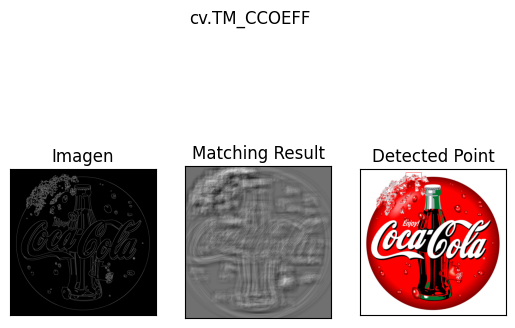

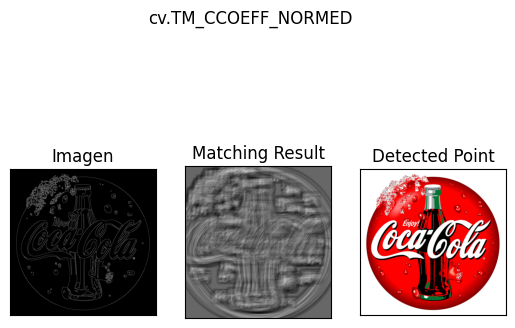

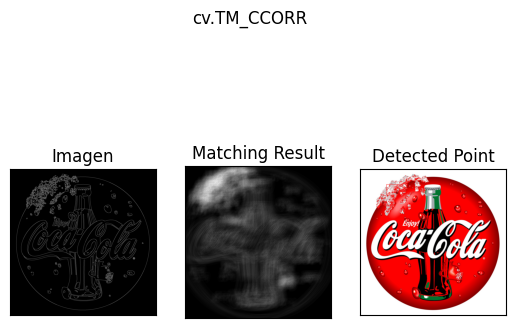

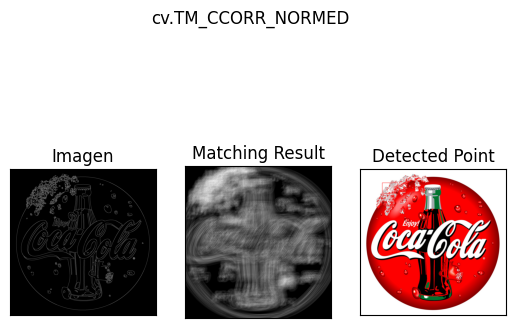

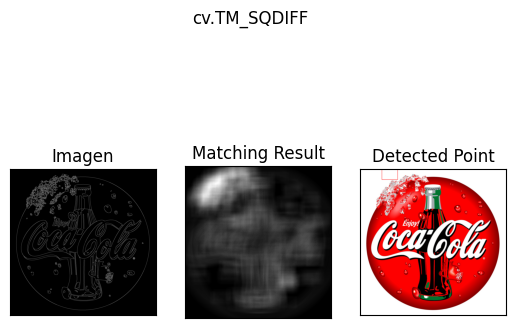

...

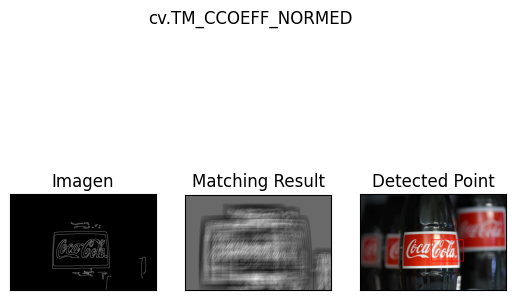

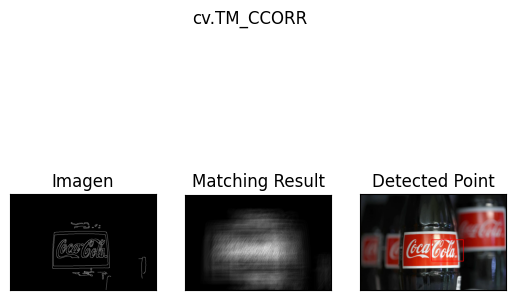

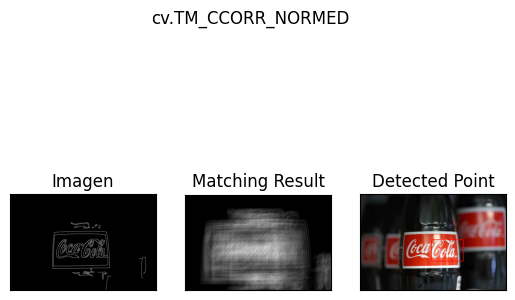

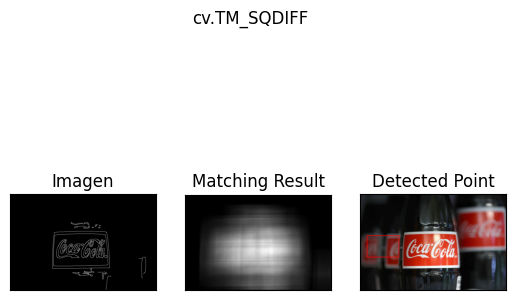

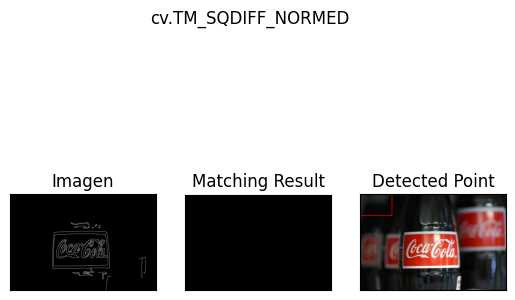

In [125]:

template=cv.imread('pattern.png')

template=canny_bordes(template,5,0,50,250)
template=cv.resize(template, (150,100), interpolation= cv.INTER_LINEAR)

w, h = template.shape[::-1]


methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
# Cargamos la imagen a procesar


folder_path = "coca"

# List all files in the folder
files = os.listdir(folder_path)

for file_name in files:
    # Construct the full path to the file
    file_path = os.path.join(folder_path, file_name)
    img = cv.imread(file_path)

    img_rgb= cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img_gray= cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    
    bordes=canny_bordes(img,5,0,50,250)
    

    for meth in methods:
        # Hago una copia de la imagen porque ciclo a ciclo le dibujo rectángulos
        img_salida = img_rgb.copy()
        
        method = eval(meth)
        
        # Aplicamos la coincidencia de patrones
        #--------------------------------------
        res = cv.matchTemplate(bordes, template, method)
        
        # Encontramos los valores máximos y mínimos
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
        
        # Si el método es TM_SQDIFF o TM_SQDIFF_NORMED, tomamos el mínimo
        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        
        # Marcamos el lugar donde lo haya encontrado
        #----------------------------------------
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv.rectangle(img_salida,top_left, bottom_right, 255, 2)
        
        # Graficamos el procesamiento y la salida
        #----------------------------------------
        plt.figure()
        
        plt.subplot(131),plt.imshow(bordes,cmap = 'gray')
        plt.title('Imagen'), plt.xticks([]), plt.yticks([])
        
        # Resultado de coincidencia
        plt.subplot(132),plt.imshow(res,cmap = 'gray')
        plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
        
        # Imagen original con recuadros
        plt.subplot(133),plt.imshow(img_salida)
        plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
        
        plt.suptitle(meth)
        plt.show()
       

Conclusiones:

El metodo que mejor fuciono fue el 'cv.TM_CCOEFF_NORMED'
El trabajo previo a las imagenes ayuda lo que principalmente afecta el encontrar la figura es el tamaño de la misma.
Respetando el metodo y los trabajos previos a las imagenes voy a Iterar sobre el tamaño y las escalas de las imagenes para mejorar los resultados

Valor Funcion Objetivo =  0.11972790211439133


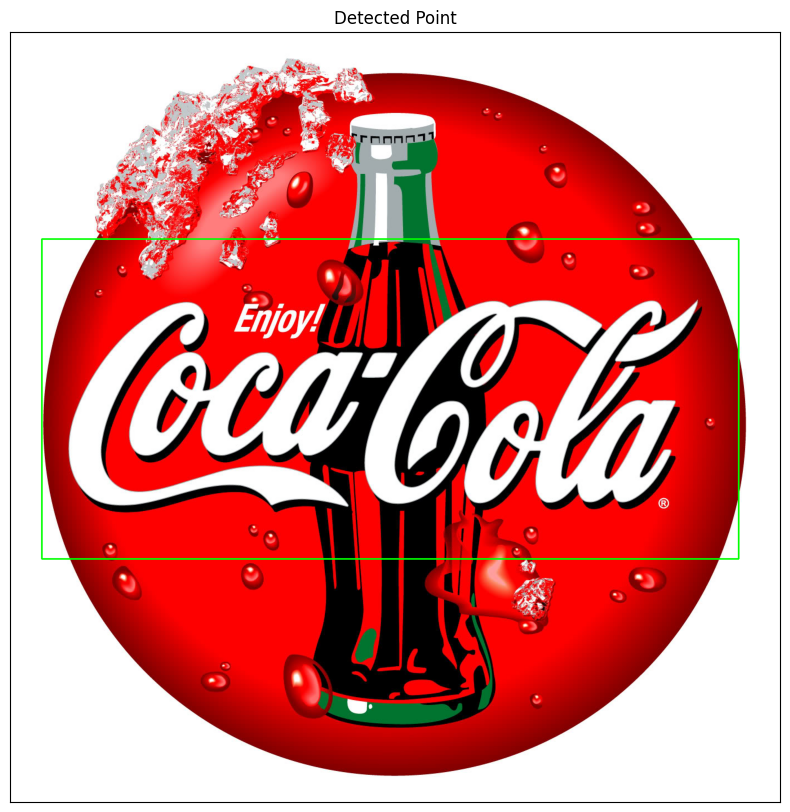

Valor Funcion Objetivo =  0.19096338748931885


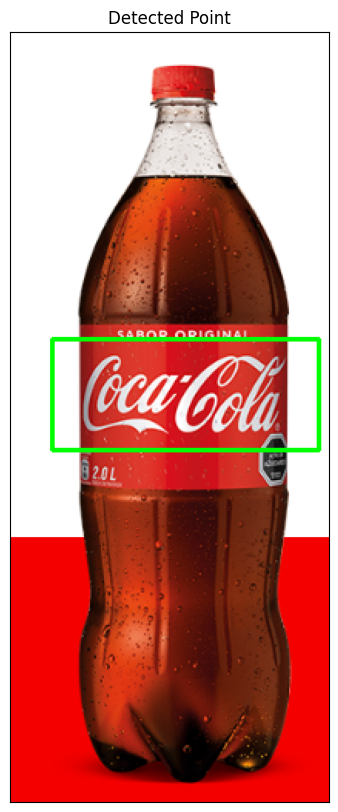

Valor Funcion Objetivo =  0.07335951924324036


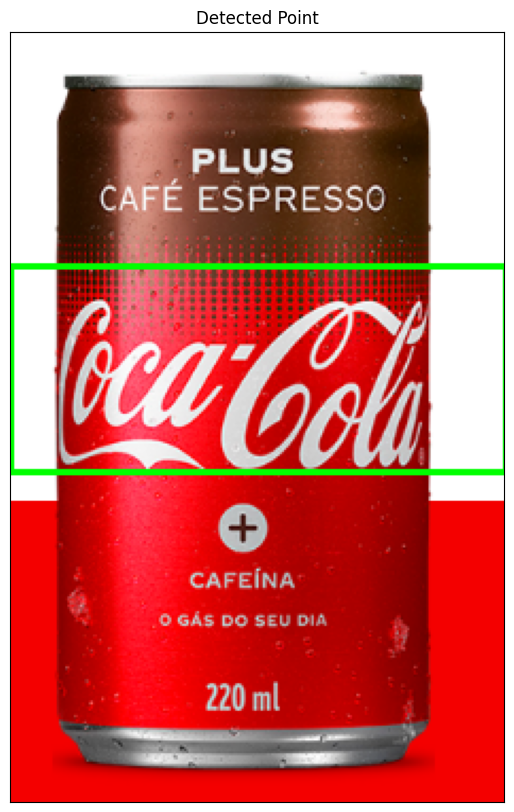

Valor Funcion Objetivo =  0.13518963754177094


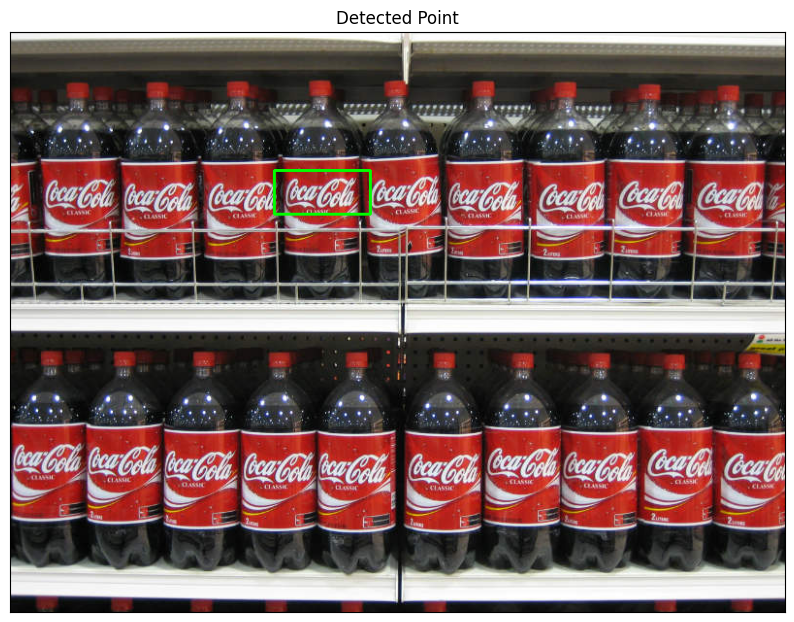

Valor Funcion Objetivo =  0.09716056287288666


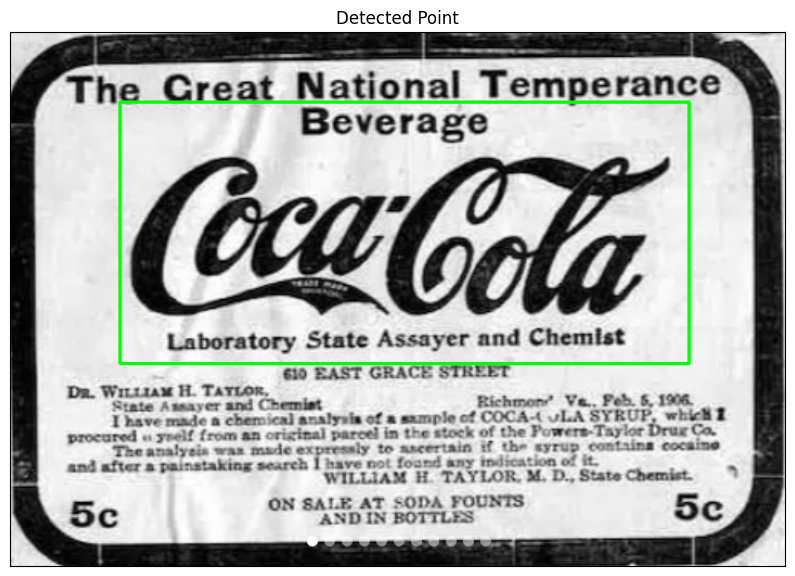

Valor Funcion Objetivo =  0.16546842455863953


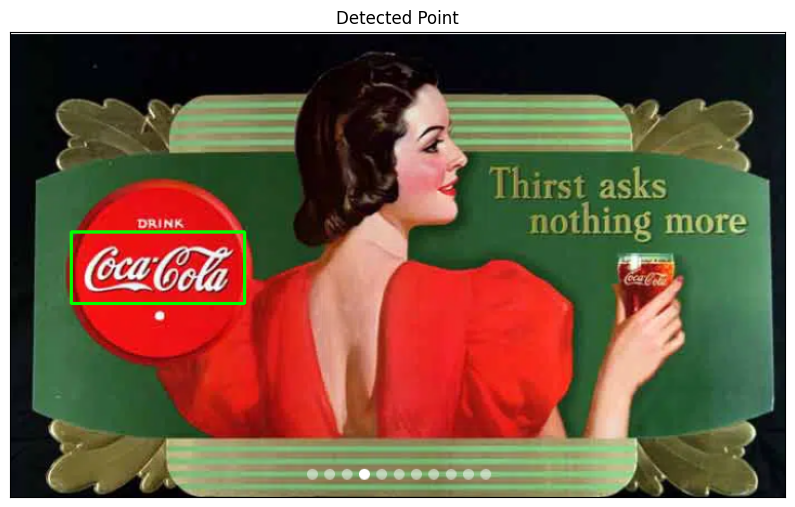

Valor Funcion Objetivo =  0.11461080610752106


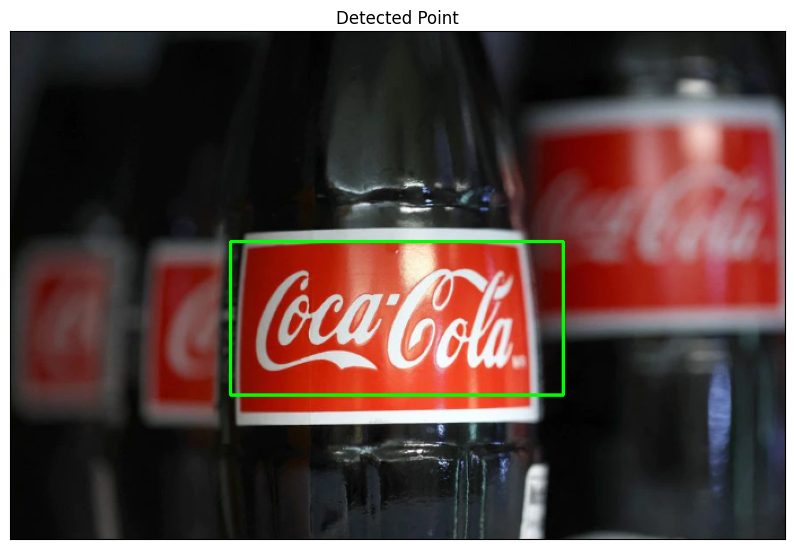

In [126]:
def deteccion(img, templ):
    #methods = 'cv.TM_CCOEFF_NORMED'  Tuvo la mejor performance
    meth = 'cv.TM_CCOEFF_NORMED' 
    # Step de factor de escala para la busqueda
    n_step = 25
    # Rango de relacion de aspecto de la imagen para la busqueda. Permite deformar la imagen dentro de este rango.
    aspect_ratio = [0.95, 1.15, 0.1]
    # Factor maximo de ampliacion de la imagen
    fact_max = 4
    method = eval(meth)
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    templ_gray = cv.cvtColor(templ, cv.COLOR_BGR2GRAY)
    
    # templ_edges= cv.Canny(templ_gray,templ_canny[0],templ_canny[1],L2gradient=True)
    templ_edges=canny_bordes(templ_gray,3,0,75,250)
    h_img, w_img = img_gray.shape
    h_temp, w_temp = templ_gray.shape
    # Definimos los % minimos de escala de la imagen. El tamaño de la imagen (en ancho o alto) nunca puede ser inferio al template.
    h_fmin = h_temp / h_img 
    w_fmin = w_temp / w_img / (aspect_ratio[0])
    # Definimos los factores de escala donde buscaremos el template. 
    size_ratio = [max(h_fmin,w_fmin), fact_max, (fact_max-(max(h_fmin,w_fmin)))/n_step]
    
    # Vector de valor maximo. Lo usamos para ver como evoluciona el valor maximo vs el barrido a diferentes escalas
    vect_obj = []
    obj = 0

    # Hacemos una iteracion por todo el rango de escalas y por todas las relaciones de aspecto
    # En cada iteracion, obtenemos la mejor metrica y la comparamos con la mejor hasta ahora, 
    # si es mejor, nos quedamos con ella.
    # ----------------------------------------------------------------------------------------
    for i in np.arange(size_ratio[0],size_ratio[1],size_ratio[2]):

        for j in np.arange(aspect_ratio[0],aspect_ratio[1],aspect_ratio[2]):

            height = round(h_img * i)
            width = round(w_img * i * j)
            
            img_resize_aux = cv.resize(img_gray, (width, height), interpolation= cv.INTER_LINEAR)
    
           
            img_resize_aux_edges =canny_bordes(img_resize_aux,3,1,75,200)
            res_aux = cv.matchTemplate(img_resize_aux_edges, templ_edges, method)
    
            min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res_aux) 
            
            # Aplicamos la coincidencia de patrones
            #--------------------------------------
            res = cv.matchTemplate(img_resize_aux_edges, templ_edges, method)
        
            # Encontramos los valores máximos y mínimos
            min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
            vect_obj.append(max_val)

            if max_val > obj:
                top_left = max_loc
                factor = i
                obj = max_val
                aspect = j
                res=res
          

    # Hacemos un rezise del templete para plotearlo en la imagen a escala original
    # ----------------------------------------------------------------------------
    width_temp = round(w_temp / factor / aspect)
    height_temp = round(h_temp / factor)

    temp_resize = cv.resize(templ_edges, (width_temp, height_temp), interpolation= cv.INTER_LINEAR)
    h, w  = temp_resize.shape
    
    # Marcamos el lugar donde lo haya encontrado
    #----------------------------------------
    top_left = (round(top_left[0]/factor/aspect), round(top_left[1]/factor))
    bottom_right = (top_left[0] + w, top_left[1] + h)
 
    # Imprimimos algunos valores importantes del algoritomo
    #------------------------------------------------------

    print('Valor Funcion Objetivo = ', obj)
   
    #plt.figure(2,figsize=(20,20))
    #plt.plot(vect_obj, '-*')
    return top_left,bottom_right
def single_ploteo(img,top_left,bottom_right):

    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)       
    cv.rectangle(img_rgb,top_left, bottom_right, (0,255,0), 2)
  
    # Imagen original con recuadros
    plt.figure(1,figsize=(10,10)) 
    plt.imshow(img_rgb)
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])

    plt.show()
    

templ=cv.imread('pattern.png')
folder_path = "coca"

# List all files in the folder
files = os.listdir(folder_path)

for file_name in files:
    file_path = os.path.join(folder_path, file_name)
    img = cv.imread(file_path)
    top_left,bottom_right = deteccion(img, templ)
    single_ploteo(img,top_left,bottom_right)

Punto 2

En este caso el tamaño de la imagen a buscar es bastante parecido todas las veces que aparece, por eso voy a encontrar ese tamaño y modificar el tamaño de mi template para mejorar su busqueda

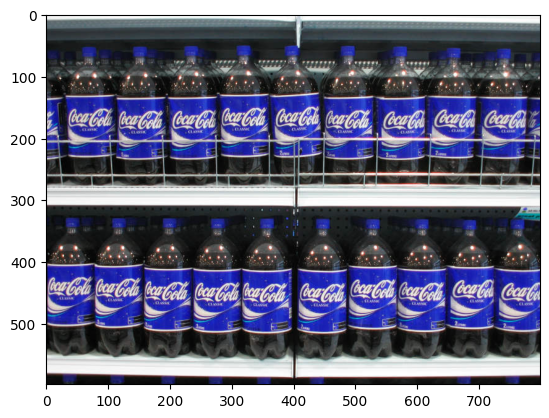

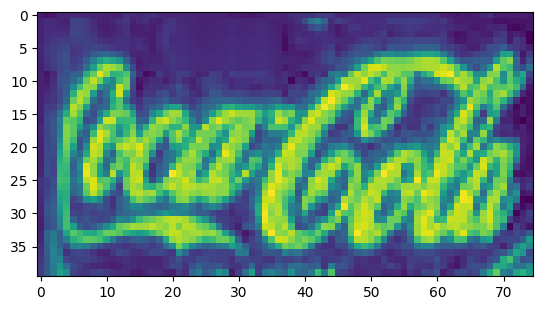

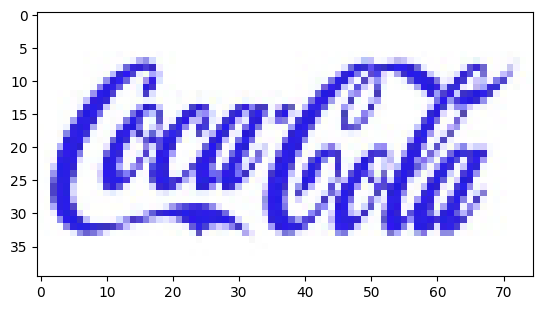

In [127]:

img_color=cv.imread('coca_multi.png')
template=cv.imread('pattern.png')
template = cv.resize(template, (75,40), interpolation= cv.INTER_LINEAR)
plt.imshow(img_color)
plt.show()
plt.imshow(img_color[150:190,115:190,0])
plt.show()
plt.imshow(template)
plt.show()

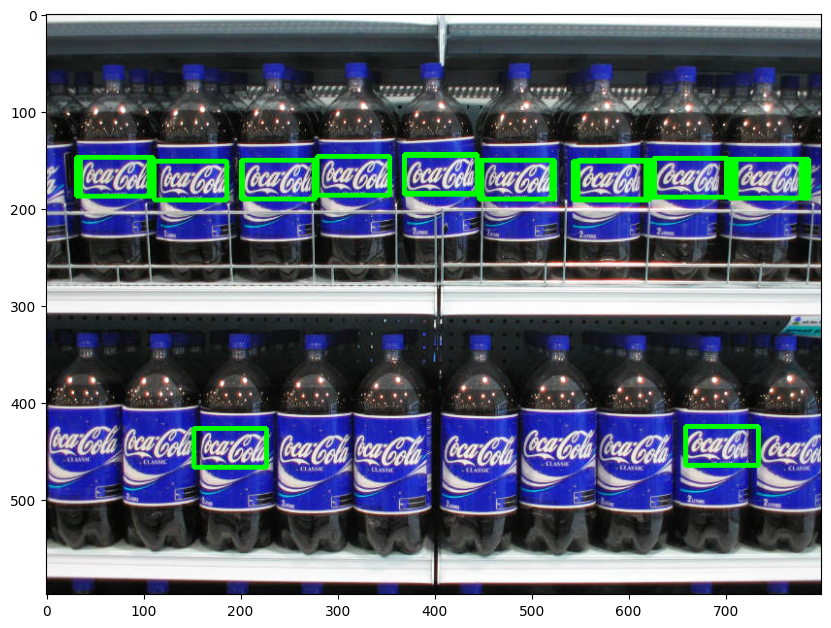

21

In [128]:
def deteccion_multiple(img, templ, threshold):
    meth = 'cv.TM_CCOEFF_NORMED' 
    method = eval(meth) 
    
    img_borde = canny_bordes(img,5,0,50,250)
    templ_borde = canny_bordes(templ,5,0,50,250) 
    
    h, w = templ_borde.shape
    
    # Aplicamos la coincidencia de patrones
    #--------------------------------------
    res = cv.matchTemplate(img_borde, templ_borde, method)
    
    # Encontramos los valores máximos y mínimos
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    
    # Crear una lista vacía para almacenar las detecciones
    detections = []
    res = (res-min_val) / (max_val-min_val)
    # Recorrer todas las ubicaciones donde la confianza es mayor que el umbral
    loc = np.where(res >= threshold)
    
    for pt in zip(*loc[::-1]):
        # Agregar la ubicación a la lista de detecciones
        detections.append((pt[0], pt[1], templ_borde.shape[1], templ_borde.shape[0]))

    # Dibujar un rectángulo alrededor de cada detección en la imagen original
    for detection in detections:
        x, y, w, h = detection
        cv.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 4)

      

    # Graficamos el procesamiento y la salida
    #----------------------------------------
    plt.figure(1,figsize=(10,10))
    plt.imshow(img)
    plt.show()
    
    return len(loc[0])

img_color=cv.imread('coca_multi.png')
template=cv.imread('pattern.png')
template = cv.resize(template, (75,40), interpolation= cv.INTER_LINEAR)
deteccion_multiple(img_color, template, 0.9)